In [1]:
options(repr.plot.width=15, repr.plot.height=10)

In [3]:
library(plyr)
library(ggplot2)
library(corpcor)
library(evolqg)
library(tidyverse)
library(cowplot)
library(patchwork)
library(psych)
library(doMC)
registerDoMC(8)

In [4]:
data_folder = "/Genomics/ayroleslab2/lamaya/bigProject/eQTLcatalog/modularity/matrices"
dir(data_folder)

[1] "README"                                                                    
[2] "VOOMCounts_CPM1_body_ctrl_onlygenesinmainchr_939ind_covfree_Jul21.21.txt"  
[3] "VOOMCounts_CPM1_head_ctrl_onlygenesinmainchr_940ind_covfree_Jul21.21.txt"  
[4] "VOOMCounts_CPM5_counts4M_covfree_body_ctrl_onlygenesinmainchr_Jul20.21.txt"
[5] "VOOMCounts_CPM5_counts4M_covfree_head_ctrl_onlygenesinmainchr_Jul20.21.txt"

In [5]:
expr_list = list(body_low = t(read.table(file.path(data_folder, 
                                             "VOOMCounts_CPM1_body_ctrl_onlygenesinmainchr_939ind_covfree_Jul21.21.txt"), 
                                   row.names = 1)),
                 body_high = t(read.table(file.path(data_folder, 
                                             "VOOMCounts_CPM5_counts4M_covfree_body_ctrl_onlygenesinmainchr_Jul20.21.txt"), 
                                   row.names = 1)), 
                 head_low = t(read.table(file.path(data_folder, 
                                             "VOOMCounts_CPM1_head_ctrl_onlygenesinmainchr_940ind_covfree_Jul21.21.txt"), 
                                   row.names = 1)),
                 head_high = t(read.table(file.path(data_folder, 
                                             "VOOMCounts_CPM5_counts4M_covfree_head_ctrl_onlygenesinmainchr_Jul20.21.txt"), 
                                   row.names = 1)))
rownames(expr_list[[1]]) = gsub("^X", "", rownames(expr_list[[1]]))
rownames(expr_list[[2]]) = gsub("^X", "", rownames(expr_list[[2]]))
rownames(expr_list[[3]]) = gsub("^X", "", rownames(expr_list[[3]]))
rownames(expr_list[[4]]) = gsub("^X", "", rownames(expr_list[[4]]))

In [6]:
corrPearson <- llply(expr_list, corr.test, method="pearson", ci=F, .parallel = TRUE)

In [7]:
gene_list = lapply(expr_list, colnames)
common_genes_low = gene_list$body_low[gene_list$body_low %in% gene_list$head_low]
common_genes_high = gene_list$body_high[gene_list$body_high %in% gene_list$head_high]
common_genes = common_genes_high[common_genes_high %in% common_genes_low]

In [8]:
x = ldply(expr_list, dim)
colnames(x) = c("data", "Num. ind.", "Num. Genes")
x

data,Num. ind.,Num. Genes
<chr>,<int>,<int>
body_low,939,8245
body_high,252,5533
head_low,940,8651
head_high,214,5584


In [9]:
sapply(gene_list, length)
length(common_genes_low)
length(common_genes_high)
length(common_genes)

body_low body_high  head_low head_high 
     8245      5533      8651      5584

[1] 7563

[1] 4281

[1] 4281

In [10]:
lt = function(x) x[lower.tri(x)]
corr_list_df = list(low = tibble(
    pearson_body = lt(corrPearson[["body_low"]]$r[common_genes_low,common_genes_low]), 
    pearson_head = lt(corrPearson[["head_low"]]$r[common_genes_low,common_genes_low])
                                ),
                    high = tibble(
    pearson_body = lt(corrPearson[["body_high"]]$r[common_genes_high,common_genes_high]), 
    pearson_head = lt(corrPearson[["head_high"]]$r[common_genes_high,common_genes_high])
                                ),
                    all = tibble(
    pearson_body_low  = lt(corrPearson[["body_low"]]$r[common_genes,common_genes]), 
    pearson_body_high = lt(corrPearson[["body_high"]]$r[common_genes,common_genes]),
    pearson_head_low  = lt(corrPearson[["head_low"]]$r[common_genes,common_genes]),
    pearson_head_high = lt(corrPearson[["head_high"]]$r[common_genes,common_genes])
                                )
                   )

In [11]:
hlbl = ggplot(corr_list_df$low, aes(pearson_body, pearson_head)) + geom_hex(bins = 1000) + 
     geom_abline(intercept = 0, slope = 1) + 
     scale_x_continuous(n.breaks = 10) +
     scale_y_continuous(n.breaks = 10) +
     theme_bw() + theme(legend.position = "none") + ggtitle("Body vs Head - Low QC")
hhbh = ggplot(corr_list_df$high, aes(pearson_body, pearson_head)) + geom_hex(bins = 1000) + 
     geom_abline(intercept = 0, slope = 1) +  
     scale_x_continuous(n.breaks = 10) +
     scale_y_continuous(n.breaks = 10) +
     theme_bw() + theme(legend.position = "none") + ggtitle("Body vs Head - High QC")
blbh = ggplot(corr_list_df$all, aes(pearson_body_low, pearson_body_high)) + geom_hex(bins = 1000) + 
     geom_abline(intercept = 0, slope = 1) + 
     scale_x_continuous(n.breaks = 10) +
     scale_y_continuous(n.breaks = 10) +
     theme_bw() + theme(legend.position = "none") + ggtitle("Body - High vs Low QC")
hlhh = ggplot(corr_list_df$all, aes(pearson_head_low, pearson_head_high)) + geom_hex(bins = 1000) + 
     geom_abline(intercept = 0, slope = 1) + 
     scale_x_continuous(n.breaks = 10) +
     scale_y_continuous(n.breaks = 10) +
     theme_bw() + theme(legend.position = "none") + ggtitle("Head - High vs Low QC")
#bb = ggplot(corr_df, aes(pearson_body)) + geom_histogram(bins = 100) + theme_bw()
#hh = ggplot(corr_df, aes(pearson_head)) + geom_histogram(bins = 100) + theme_bw()

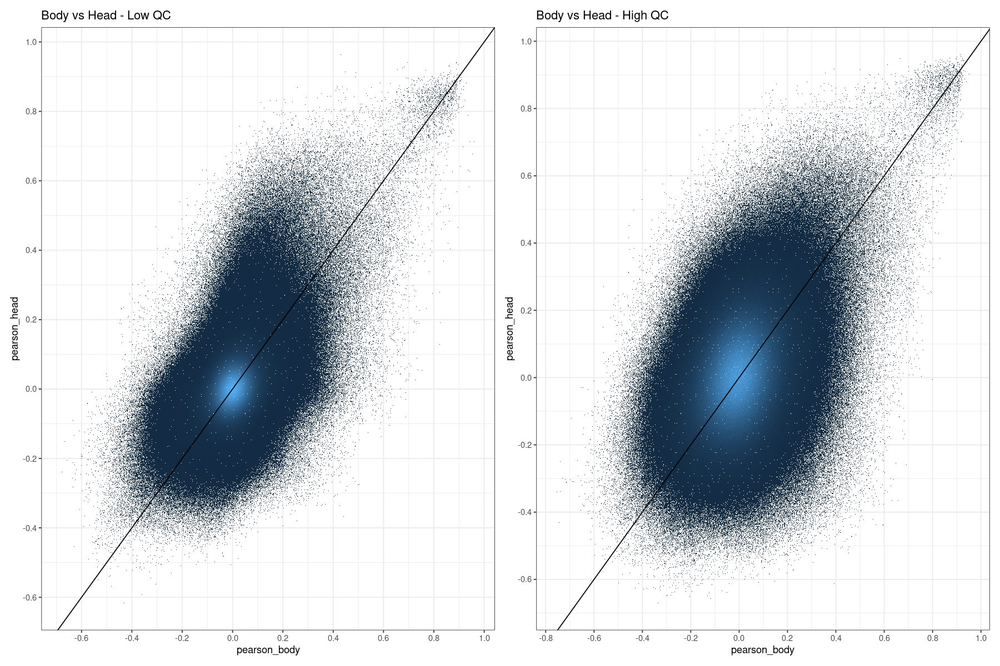

In [11]:
hlbl + hhbh

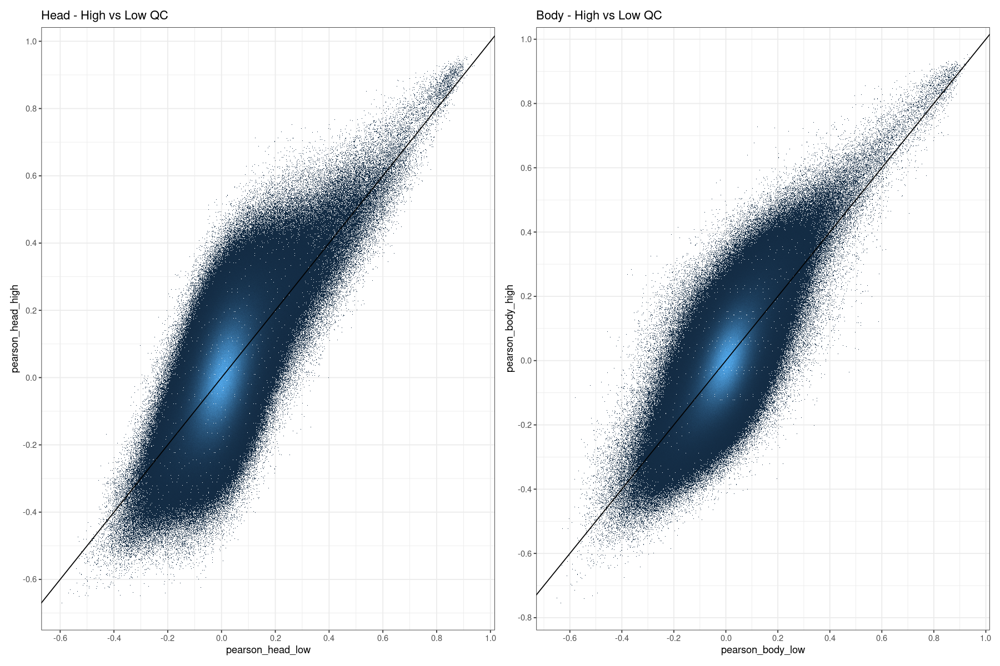

In [12]:
hlhh + blbh

In [87]:
calcMeanExprMeanCorr <- function(label, expr = expr_list, corr = corrPearson){
    cmat = corr[[label]]$r
    diag(cmat) = NA
    mean_corr = colMeans(cmat, na.rm = TRUE)
    expr_mat = expr[[label]]
    mean_expr = colMeans(expr_mat)
    data.frame(gene = colnames(expr_mat), expr = mean_expr, correlation = mean_corr)
}
calcGeomMeanExprRawCorr <- function(label, expr = expr_list, corr = corrPearson, n = NULL){
    expr_mat = expr[[label]] +  min(expr[[label]]) + 0.1
    gene_names = colnames(corr[[label]]$r)
    gene_grid = expand.grid(gene_names, gene_names)
    if(is.null(n)) n = nrow(gene_grid)
    gene1 = gene_grid$Var1
    gene2 = gene_grid$Var2
    results = array(NA, dim = c(n, 3))
    colnames(results) = c("correlation", "mean", "gmean")

    gm_means_expr = apply(expr_mat, 2, gm_mean)
    means_expr = colMeans(expr_mat)

    for(i in 1:n){
        g = c(gene1[i], gene2[i])
        results[i,1] = corr[[label]]$r[g[1], g[2]]
        results[i,2] = mean(c(means_expr[g[1]], means_expr[g[2]]))
        results[i,3] = gm_mean(c(gm_means_expr[g[1]], gm_means_expr[g[2]]))
    }
    results_df = data.frame(gene_grid[1:n,], results) %>% filter(correlation != 1)
    results_df
}
gm_mean = function(x, na.rm=TRUE){
  exp(sum(log(x[x > 0]), na.rm=na.rm) / length(x))
}

In [88]:
means_by_rawcorrelations = llply(names(expr_list), calcGeomMeanExprRawCorr, .parallel = TRUE)

In [114]:
names(means_by_rawcorrelations) = names(expr_list)

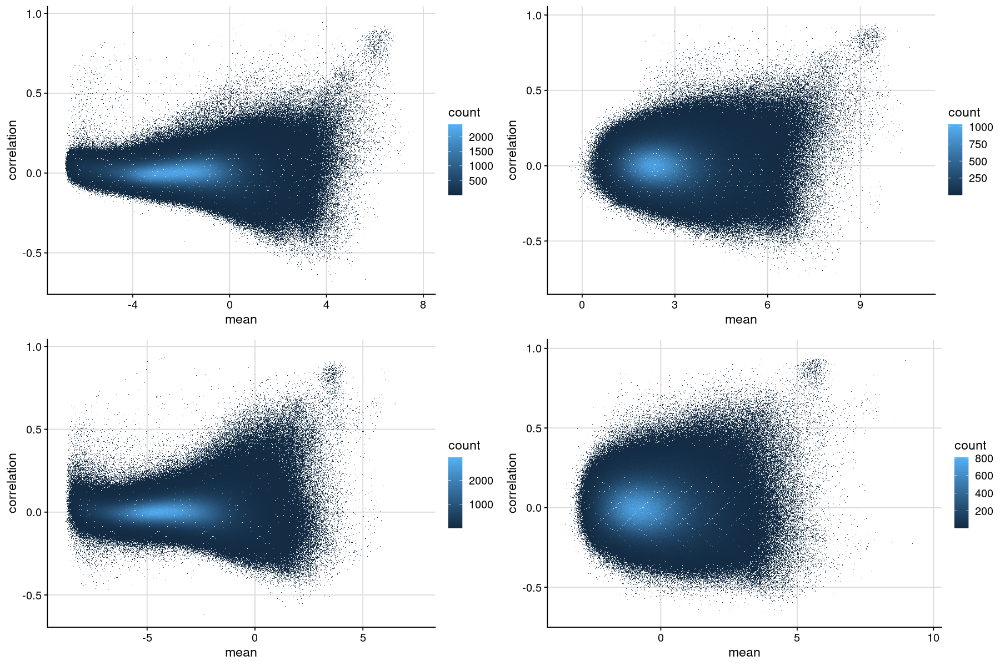

In [89]:
means_by_rawcorrelations_plots = lapply(means_by_rawcorrelations, 
    function(x) x %>% 
    ggplot(aes(mean, correlation)) + 
    geom_hex(bins = 1000) + theme_cowplot() +
    background_grid())
plot_grid(plotlist = means_by_rawcorrelations_plots, ncol = 2)

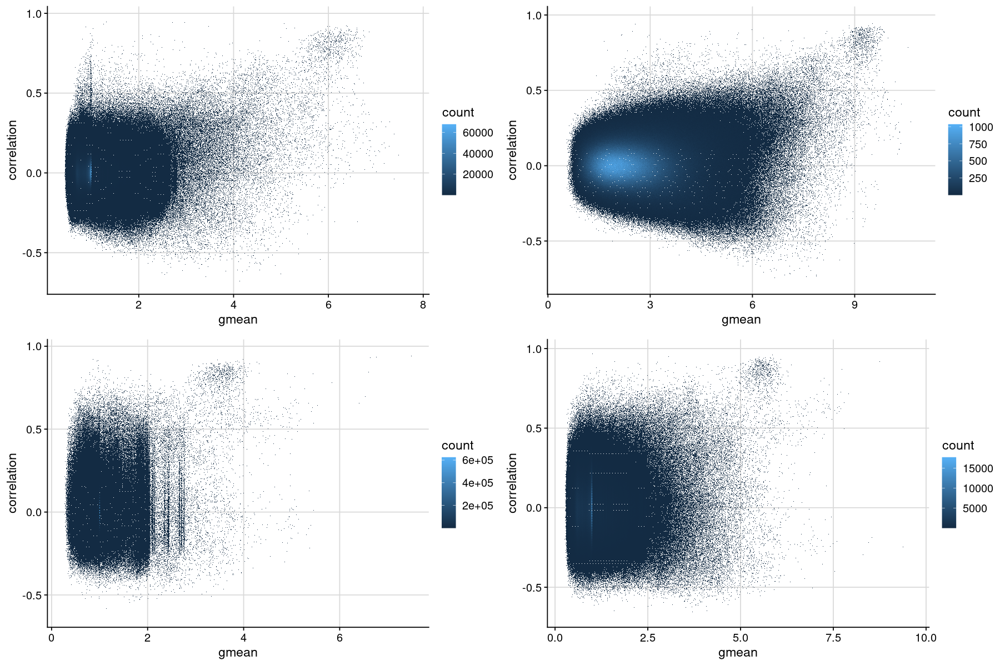

In [90]:
gmeans_by_rawcorrelations_plots = lapply(means_by_rawcorrelations, 
    function(x) x %>% 
    ggplot(aes(gmean, correlation)) + 
    geom_hex(bins = 1000) + theme_cowplot() +
    background_grid())
plot_grid(plotlist = gmeans_by_rawcorrelations_plots, ncol = 2)

In [118]:
high_corr_pairs = ldply(names(means_by_rawcorrelations), function(label){
    means_by_rawcorrelations[[label]] %>%
        filter(correlation > 0.5) %>%
        mutate(data_set = label)
})

In [119]:
write_csv(high_corr_pairs, file = "~/projects/NEX-HS_C-GxE/data/high_correlation_pairs_0.5cutoff_head-body_highQC-lowQC.csv")

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



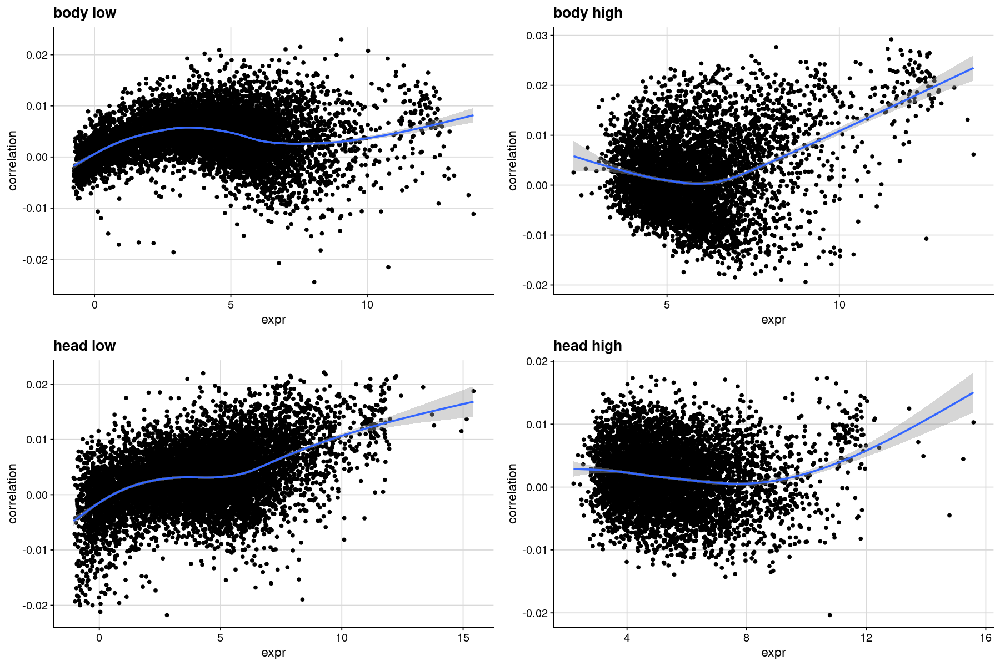

In [14]:
corr_by_expr = lapply(names(corrPearson),function(x) {
    calcMeanExprMeanCorr(x) %>%
    ggplot(aes(expr, correlation)) + geom_point() + geom_smooth() + 
    theme_cowplot() +
    background_grid() + 
    ggtitle(gsub("_", " ", x))
    })
plot_grid(plotlist = corr_by_expr, ncol = 2)

In [15]:
prop_calc <- function(p, x){
    sum(abs(x) > p) / length(x)
}

In [16]:
intervals = seq(0.1, 0.9, by = 0.1)
data.frame(cut  = intervals,
           body_high = sapply(intervals, prop_calc, lt(corrPearson$body_high$r)),
           body_low = sapply(intervals, prop_calc, lt(corrPearson$body_low$r)),
           head_high = sapply(intervals, prop_calc, lt(corrPearson$head_high$r)),
           head_low = sapply(intervals, prop_calc, lt(corrPearson$head_low$r))) %>% round(7)

cut,body_high,body_low,head_high,head_low
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.1,0.3652606,0.1291307,0.4328219,0.1090935
0.2,0.0927298,0.0167643,0.1319967,0.0148572
0.3,0.0219450,0.0033903,0.0343210,0.0042063
0.4,0.0052451,0.0009156,0.0092536,0.0015941
0.5,0.0014512,0.0003375,0.0027318,0.0006267
0.6,0.0005472,0.0001541,0.0008546,0.0002408
0.7,0.0002559,0.0000803,0.0003104,0.0000927
0.8,0.0001158,0.0000360,0.0001450,0.0000420
0.9,0.0000145,0.0000016,0.0000262,0.0000012


In [160]:
label = "body_high"
corr_histogram_plots = lapply(names(expr_list), function(label)
ggplot(data = data.frame(correlations = abs(lt(corrPearson[[label]]$r)))) + 
    geom_histogram(aes(x = correlations, y = after_stat(count / max(count))), bins = 5000) + theme_cowplot() +
        background_grid() + 
        ggtitle(gsub("_", " ", label)))


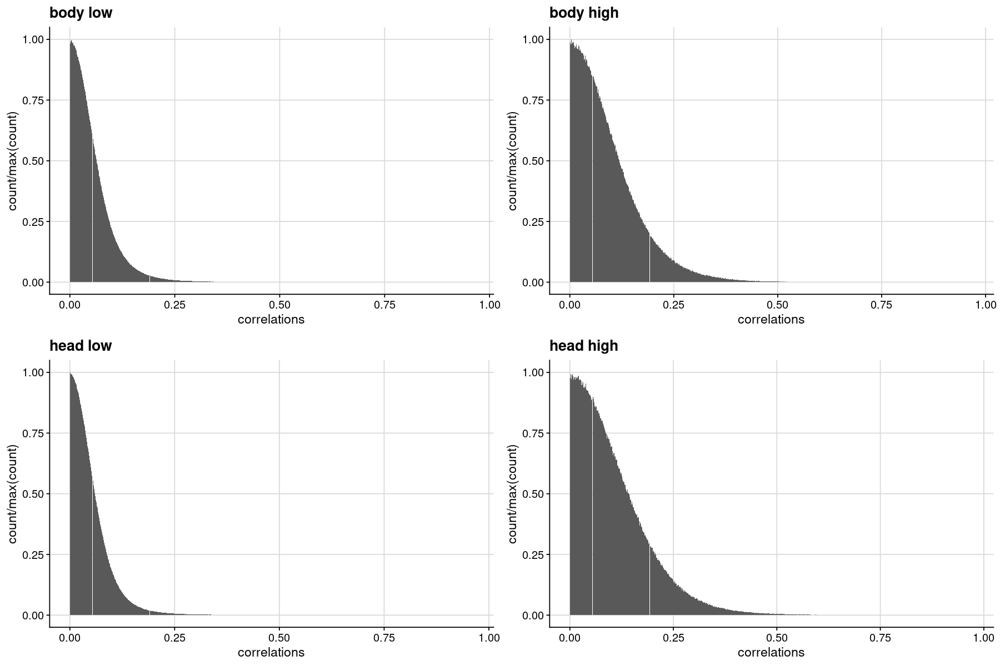

In [161]:
plot_grid(plotlist = corr_histogram_plots, ncol = 2)

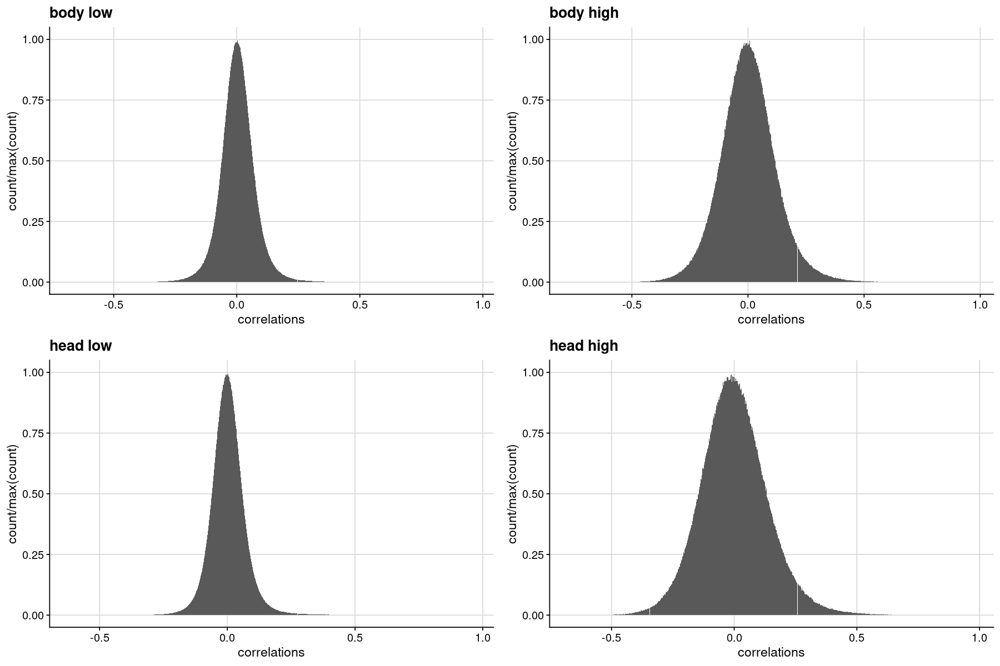

In [162]:
label = "body_high"
corr_histogram_plots = lapply(names(expr_list), function(label)
ggplot(data = data.frame(correlations = lt(corrPearson[[label]]$r))) + 
    geom_histogram(aes(x = correlations, y = after_stat(count / max(count))), bins = 5000) + theme_cowplot() +
        background_grid() + 
        ggtitle(gsub("_", " ", label)))
plot_grid(plotlist = corr_histogram_plots, ncol = 2)

In [140]:
calcExprQuantileCorr <- function(label, expr = expr_list, corr = corrPearson, n = NULL){
    expr_mat = expr[[label]]
    x = colMeans(expr_mat)
    quantile_pos = rank(x)/length(x)
    step = 0.1
    q_seq = seq(0, 1-step, by = step)
    corr_splits = vector("list", length(q_seq)-1)
    for(i in 1:length(q_seq)){
        genes = names(quantile_pos)[quantile_pos > q_seq[i] & quantile_pos < q_seq[i]+step]
        corr_splits[[i]] = data.frame(Correlation = lt(corr[[label]]$r[genes, genes]), Expr_quantile = q_seq[i]+step)
    }
    quantile_expr = do.call(rbind, corr_splits)
    quantile_expr
    }

In [144]:
quantile_expr_list = llply(names(expr_list), calcExprQuantileCorr)
names(quantile_expr_list) = names(expr_list)

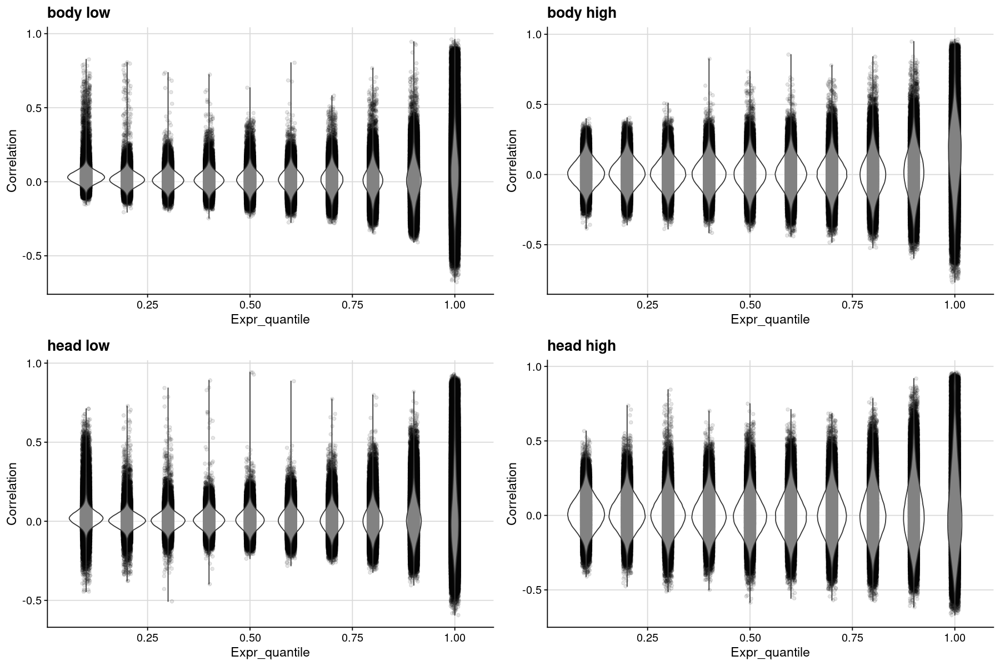

In [146]:
quantile_expr_plots = lapply(names(expr_list), function(label) quantile_expr_list[[label]] %>%
    ggplot(aes(Expr_quantile, Correlation, group = Expr_quantile)) +  
        geom_jitter(width = 0.01, alpha = 0.1) + 
        geom_violin(alpha= 0.5) +  theme_cowplot() +
        background_grid() + 
        ggtitle(gsub("_", " ", label)))
plot_grid(plotlist = quantile_expr_plots, ncol = 2)

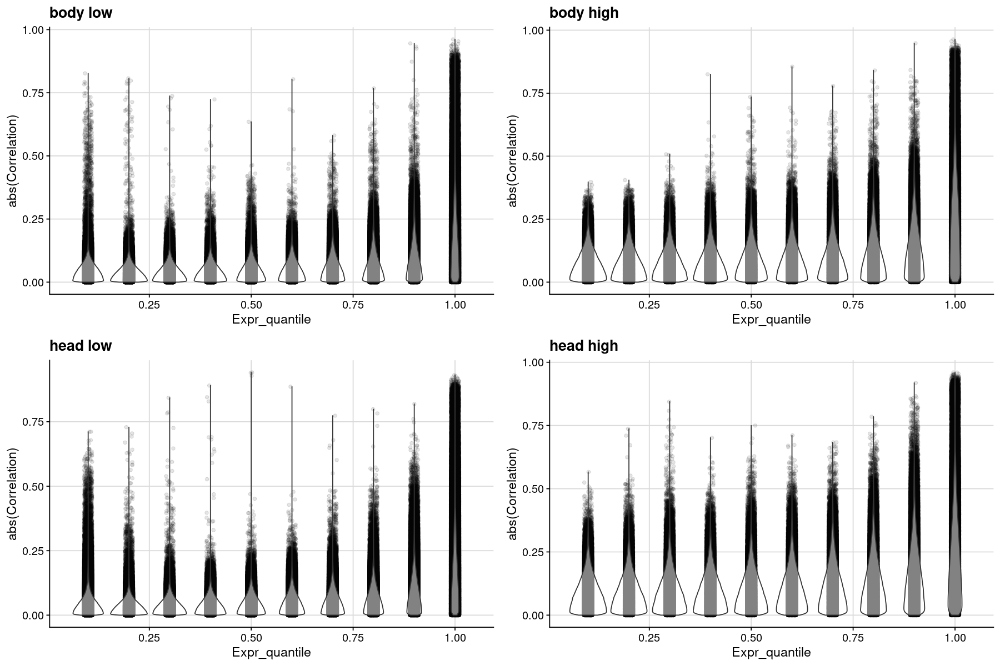

In [147]:
quantile_expr_plots = lapply(names(expr_list), function(label) quantile_expr_list[[label]] %>%
    ggplot(aes(Expr_quantile, abs(Correlation), group = Expr_quantile)) +  
        geom_jitter(width = 0.01, alpha = 0.1) + 
        geom_violin(alpha= 0.5) +  theme_cowplot() +
        background_grid() + 
        ggtitle(gsub("_", " ", label)))
plot_grid(plotlist = quantile_expr_plots, ncol = 2)

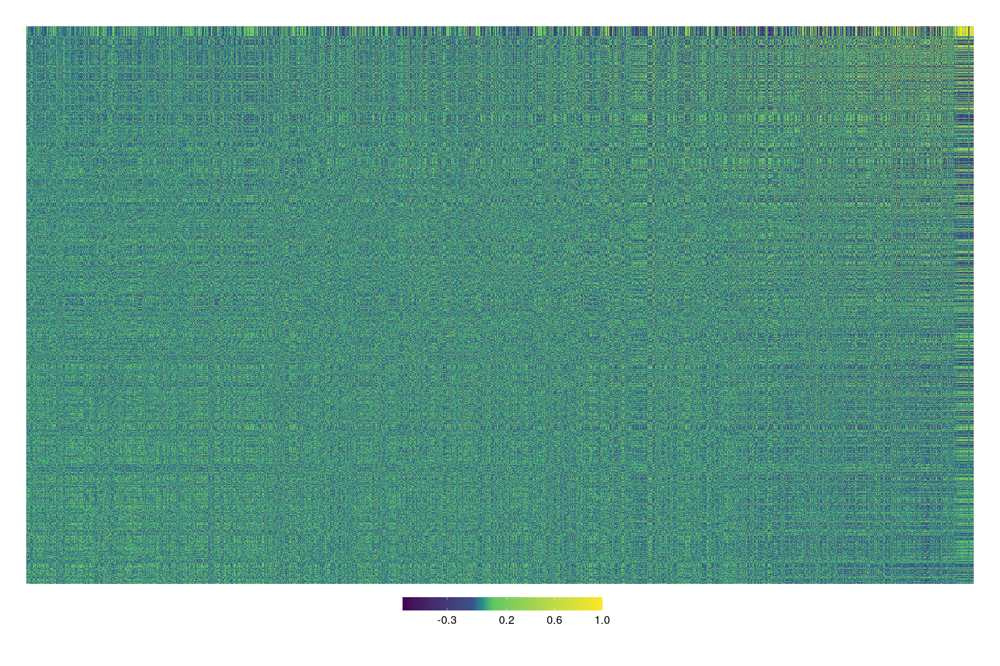

In [136]:
library(superheat)
gene_list = names(sort(quantile_pos))
superheat(corr[[label]]$r[gene_list,gene_list])